In [3]:
from typing import Dict, List, Tuple, Optional
import silence_tensorflow.auto
from epigenomic_dataset import load_epigenomes
from epigenomic_dataset import active_enhancers_vs_inactive_enhancers
from epigenomic_dataset import active_promoters_vs_inactive_promoters
from sklearn.impute import KNNImputer
from sklearn.preprocessing import RobustScaler
import pandas as pd
import numpy as np
from tqdm.auto import tqdm
from tqdm.notebook import tqdm_notebook
from cache_decorator import Cache
from tqdm.keras import TqdmCallback
from barplots import barplots
from ucsc_genomes_downloader import Genome
from keras_bed_sequence import BedSequence
from keras_mixed_sequence import MixedSequence, VectorSequence
import matplotlib.pyplot as plt
import seaborn as sns
from multiprocessing import cpu_count
import os
from pathlib import Path
import json
import shutil
import datetime

In [4]:
def to_bed(data:pd.DataFrame)->pd.DataFrame:
    """Return bed coordinates from given dataset."""
    return data.reset_index()[data.index.names]

In [5]:
from tqdm.auto import tqdm
from epigenomic_dataset import active_enhancers_vs_inactive_enhancers, active_promoters_vs_inactive_promoters

window_size = 256
cell_line = "H1"
data_statistics = []
threshold = [0, 0.25, 0.5, 0.75, 1]
enable_debug = False

for tr in tqdm(threshold, desc="Task threshold AEIE:"):
    X_AEIE, y_AEIE = active_enhancers_vs_inactive_enhancers(
        binarize=True,
        cell_line=cell_line,
        window_size=window_size,
        min_active_tpm_value=tr,
        max_inactive_tpm_value=tr
    )

    data_statistics.append({
                "Task": "AE_vs_IE",
                "Region": "Enhancers",
                "Cell_line": cell_line,
                "Threshold": tr,
                "Total_Sample": y_AEIE.shape[0],
                "Features": X_AEIE.shape[1],
                "Positives_Value": (y_AEIE.values==1).sum(),
                "Negatives_Value": (y_AEIE.values==0).sum(),
                "Mean_Value": (y_AEIE.values).mean()
            })

    if(enable_debug):
      print("="*80)
      print(f"Task: active_enhancers_vs_inactive_enhancers")
      print(f"Region: Enhancers")
      print(f"Cell_line: {cell_line}")
      print(f"Threshold: {tr}")
      print(f"Total_Sample: {(y_AEIE).count()}")
      print(f"Features: {X_AEIE.shape[1]}")
      print(f"Positives_Value: {(y_AEIE.values==1).sum()}")  # True
      print(f"Negatives_Value: {(y_AEIE.values==0).sum()}")  # False
      print(f"Mean_Value: {(y_AEIE.values).mean()}")
      print("="*80)

for tr in tqdm(threshold, desc="Task threshold APIP:"):
    X_APIP, y_APIP = active_promoters_vs_inactive_promoters(
        binarize=True,
        cell_line=cell_line,
        window_size=window_size,
        min_active_tpm_value=tr,
        max_inactive_tpm_value=tr
    )

    data_statistics.append({
                "Task": "AP_vs_IP",
                "Region": "Promoters",
                "Cell_line": cell_line,
                "Threshold": tr,
                "Total_Sample": X_APIP.shape[0],
                "Features": X_APIP.shape[1],
                "Positives_Value": (y_APIP.values==1).sum(),
                "Negatives_Value": (y_APIP.values==0).sum(),
                "Mean_Value": (y_APIP.values).mean()
            })

    if(enable_debug):
      print("="*80)
      print(f"Task: active_promoters_vs_inactive_promoters")
      print(f"Region: Promoters"),
      print(f"Cell_line: {cell_line}")
      print(f"Threshold: {tr}")
      print(f"Total_Sample: {(y_APIP).count()}")
      print(f"Features: {X_APIP.shape[1]}")
      print(f"Positives_Value: {(y_APIP.values==1).sum()}")  # True
      print(f"Negatives_Value: {(y_APIP.values==0).sum()}")  # False
      print(f"Mean_Value: {(y_APIP.values).mean()}")
      print("="*80)

data_statistics = pd.DataFrame(data_statistics)
data_statistics.style.set_properties(**{'text-align': 'center'})

Task threshold AEIE::   0%|          | 0/5 [00:00<?, ?it/s]

Task threshold APIP::   0%|          | 0/5 [00:00<?, ?it/s]

,Task,Region,Cell_line,Threshold,Total_Sample,Features,Positives_Value,Negatives_Value,Mean_Value
0,AE_vs_IE,Enhancers,H1,0.000000,63285,58,3038,60247,0.048005
1,AE_vs_IE,Enhancers,H1,0.250000,63285,58,3038,60247,0.048005
2,AE_vs_IE,Enhancers,H1,0.500000,63285,58,3038,60247,0.048005
3,AE_vs_IE,Enhancers,H1,0.750000,63285,58,715,62570,0.011298
4,AE_vs_IE,Enhancers,H1,1.000000,63285,58,715,62570,0.011298
5,AP_vs_IP,Promoters,H1,0.000000,99881,58,35191,64690,0.352329
6,AP_vs_IP,Promoters,H1,0.250000,99881,58,35191,64690,0.352329
7,AP_vs_IP,Promoters,H1,0.500000,99881,58,35191,64690,0.352329
8,AP_vs_IP,Promoters,H1,0.750000,99881,58,35191,64690,0.352329
9,AP_vs_IP,Promoters,H1,1.000000,99881,58,25559,74322,0.255895


In [6]:
data_statistics.iloc[[1,9], [1,6,7]]

,Region,Positives_Value,Negatives_Value
1,Enhancers,3038,60247
9,Promoters,25559,74322


Andiamo quindi a verificare lo sbilanciamento tra positivi e negativi delle due classi:


*   AEvsIE - active_enhancers_vs_inactive_enhancers
*   APvsIP - active_promoters_vs_inactive_promoters


Text(0.5, 0, 'Labels')

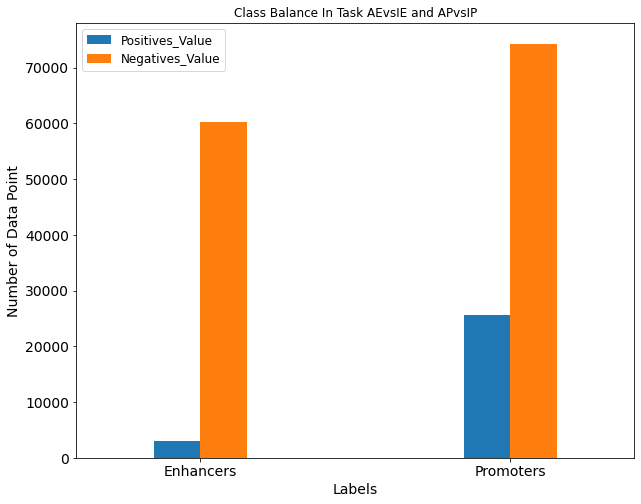

In [7]:
title = 'Class Balance In Task AEvsIE and APvsIP'
data_statistics.iloc[[1,9], [1,6,7]].plot(title=title, x="Region", y=["Positives_Value", "Negatives_Value"], kind="bar", figsize=(10, 8), width=0.3, fontsize=14)
plt.legend(loc=2, prop={'size': 12})
plt.yticks(rotation=0)
plt.xticks(rotation=0)
plt.ylabel('Number of Data Point', fontsize=14)
plt.xlabel(xlabel='Labels', fontsize=14)

In [8]:
cell_line = "H1"
window_size = 256
enhancers_threshold = 0
promoters_threshold = 1

In [9]:
X_AEvsIE, y_AEvsIE = active_enhancers_vs_inactive_enhancers(
    binarize=False,
    cell_line=cell_line,
    window_size=window_size,
    min_active_tpm_value=enhancers_threshold,
    max_inactive_tpm_value=enhancers_threshold
)

X_APvsIP, y_APvsIP = active_promoters_vs_inactive_promoters(
    binarize=False,
    cell_line=cell_line,
    window_size=window_size,
    min_active_tpm_value=promoters_threshold,
    max_inactive_tpm_value=promoters_threshold
)

Text(0.5, 1.0, 'Value < 1 in active_enhancers_vs_inactive_enhancers')

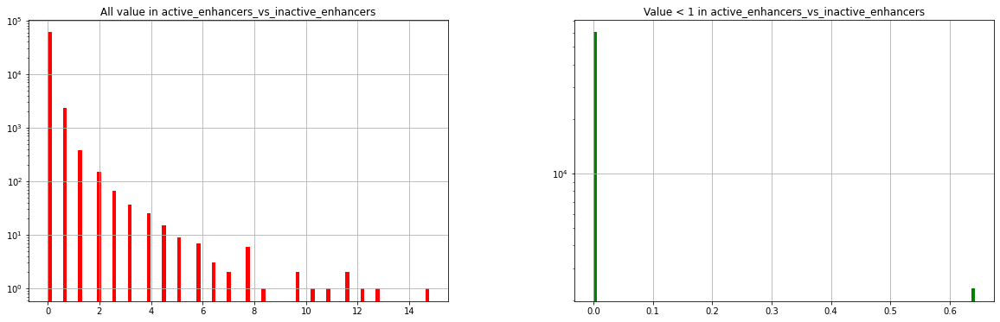

In [10]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 6))
y_AEvsIE.hist(ax=axes[0], log=True, bins=100, color='red')
axes[0].set_title("All value in active_enhancers_vs_inactive_enhancers")

y_AEvsIE[y_AEvsIE<1].hist(ax=axes[1], log=True, bins=100, color='green')
axes[1].set_title("Value < 1 in active_enhancers_vs_inactive_enhancers")

Text(0.5, 1.0, 'Value < 1 in active_promoters_vs_inactive_promoters')

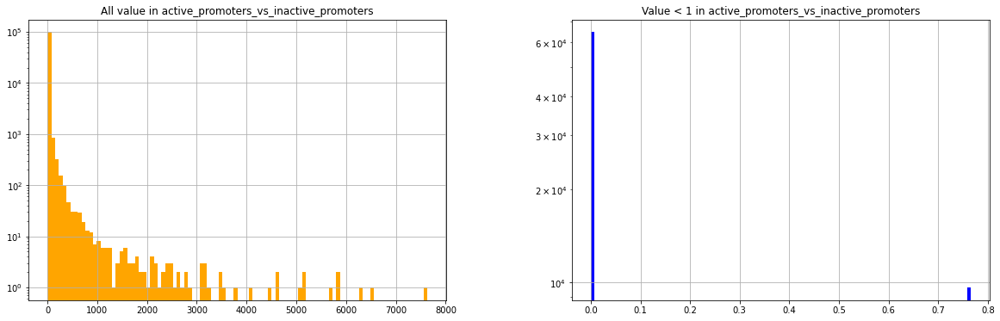

In [11]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 6))
y_APvsIP.hist(ax=axes[0], log=True, bins=100, color='orange')
axes[0].set_title("All value in active_promoters_vs_inactive_promoters")

y_APvsIP[y_APvsIP<1].hist(ax=axes[1], log=True, bins=100, color='blue')
axes[1].set_title("Value < 1 in active_promoters_vs_inactive_promoters")

### Retrive epigenomic data

In [12]:
X_AEvsIE_Bin, y_AEvsIE_Bin = active_enhancers_vs_inactive_enhancers(
    binarize=True,
    cell_line=cell_line,
    window_size=window_size,
    min_active_tpm_value=enhancers_threshold,
    max_inactive_tpm_value=enhancers_threshold,
    root="bio_data/Epigenomic/Enhancers",
    verbose=1
)

X_APvsIP_Bin, y_APvsIP_Bin = active_promoters_vs_inactive_promoters(
    binarize=True,
    cell_line=cell_line,
    window_size=window_size,
    min_active_tpm_value=promoters_threshold,
    max_inactive_tpm_value=promoters_threshold,
    root="bio_data/Epigenomic/Promoters",
    verbose=1
)

bed_seq_X_AEvsIE = to_bed(X_AEvsIE_Bin)
bed_seq_X_APvsIP = to_bed(X_APvsIP_Bin)

epigenomes_data = {
    "Enhancers": X_AEvsIE_Bin,
    "Promoters": X_APvsIP_Bin
}

labels = {
    "Enhancers": y_AEvsIE_Bin,
    "Promoters": y_APvsIP_Bin
}

### Retrive genomic sequence

In [13]:
from ucsc_genomes_downloader import Genome

genome = Genome(
    "hg38",
    cache_directory="bio_data/Genomes",
)

Loading chromosomes for genome hg38:   0%|          | 0/25 [00:00<?, ?it/s]

In [14]:
from keras_bed_sequence import BedSequence

def one_hot_encode(genome:Genome, data:pd.DataFrame, nucleotides:str="actg")->np.ndarray:
    return np.array(BedSequence(
        genome,
        bed=to_bed(data),
        nucleotides=nucleotides,
        batch_size=1
    ))

In [15]:
def flat_one_hot_encode(genome:Genome, data:pd.DataFrame, window_size:int, nucleotides:str="actg")->np.ndarray:
    return one_hot_encode(genome, data, nucleotides).reshape(-1, window_size*4).astype(int)

In [16]:
def to_dataframe(x:np.ndarray, window_size:int, nucleotides:str="actg")->pd.DataFrame:
    return pd.DataFrame(
        x,
        columns = [
            f"{i}{nucleotide}"
            for i in range(window_size)
            for nucleotide in nucleotides
        ]
    )

In [17]:
sequences = {
    region: to_dataframe(
        flat_one_hot_encode(genome, data, window_size),
        window_size
    )
    for region, data in epigenomes_data.items()
}

### Rate between features and samples:
In alcuni set di dati ci sono più funzionalità che campioni. Ciò può introdurre problemi come l'overfitting particolarmente forte del modello nei set di dati.

Quindi, prima di ogni altra cosa, controlliamo se i set di dati hanno un tasso di caratteristiche e campioni maggiore di uno.

In [18]:
print("="*80)
for region, x in epigenomes_data.items():
    print(
        f"The rate between features and samples for {region} data is: {x.shape[0]/x.shape[1]}"
    )
    print("="*80)

The rate between features and samples for Enhancers data is: 1091.1206896551723
The rate between features and samples for Promoters data is: 1722.0862068965516


### Nan detection:
In questo step andremo a verificare la presenza o meno all'interno del nostro
dataset di valori Nan (Not a number)

In [19]:
print("="*80)
for region, x in epigenomes_data.items():
    print("\n".join((
        f"Nan values report for {region} data:",
        f"In the document there are {x.isna().values.sum()} NaN values out of {x.values.size} values.",
        f"The sample (row) with most values has {x.isna().sum(axis=0).max()} NaN values out of {x.shape[1]} values.",
        f"The feature (column) with most values has {x.isna().sum().max()} NaN values out of {x.shape[0]} values."
    )))
    print("="*80)

Nan values report for Enhancers data:
In the document there are 1 NaN values out of 3670530 values.
The sample (row) with most values has 1 NaN values out of 58 values.
The feature (column) with most values has 1 NaN values out of 63285 values.
Nan values report for Promoters data:
In the document there are 19 NaN values out of 5793098 values.
The sample (row) with most values has 1 NaN values out of 58 values.
The feature (column) with most values has 1 NaN values out of 99881 values.


### Data imputation
Dopo aver individuato la presenza di valori mancanti all'interno dei dati epigenomici per la linea cellulare H1, possiamo applicare diversi approcci per la correzzione di tali valori mancanti. Questa operazione in statistica viene identificata con il nome di imputazione dei dati.
La più semplice forma di imputazione, è l'eliminazione dei dati mancanti, ma sono presenti anche forme più complesse tramite le quali avviene la sostituzione dei valori mancanti o errati di un dato record con alternative coerenti e plausibili ottenute dai dati stessi. Abbiamo analizzato vari tipi di imputazione:come per esempio la media, la mediana,

*   Costante: Tipicamente utilizzato quando siamo affiancati da un esperto che ci può confermare quale è il valore più opportuno da rimpiazzare. Senza questo supporto andremmo ad inserire un valore privo di senso.
*   Media: Questo approccio, non è definito statisticamente robusto, e il motivo principale è quello legato agli outliers. La loro presenza con valori veramente assurdi potrebbe sostituire il valore con un valore che non ha senso.
*   Moda: Viene considerata statisticamente robusto nei confronti degli outliers, perchè semplicemente è quel valore, se esiste, che si presenta con maggiore frequenza. Ovviamente una serie di outliers per quanti ce ne possano essere, in un dataset di buona qualità non saranno mail il valore a maggior frequenza.
*   Mediana: Come la moda anche la mediana è considerata robusta, e rappresenta  il valore che occupa il posto centrale in una serie di dati disposti in ordine crescente o decrescente. Dobbiamo solo prestare attenzione ad una cosa: se la serie è costituita da un numero pari di elementi allora non esiste un solo elemento centrale, bensì due. In questi casi la mediana è data dalla media aritmetica dei due dati centrali.
*   Nearest neighbor imputation: Sono metodi efficienti per riempire i dati mancanti in cui ogni valore mancante su alcuni record viene sostituito da un valore ottenuto da casi correlati nell'intero set di record. Oltre alla capacità di sostituire i dati mancanti con valori plausibili che siano il più vicino possibile al valore reale, gli algoritmi di imputazione dovrebbero preservare la struttura dati originale ed evitare di distorcere la distribuzione della variabile imputata.

Il k-Nearest Neighbors è quello più utilizzato in dati di questo tipo (Bilogici, Genetici) insieme a dati di tipo tabulare. Ci permette di prendere dei valori dai punti vicini al dato mancante, quindi generalmente avremmo un valore che rimane all'interno della classe (del cluster) al quale il punto appartiene. La sua complessità è quadratica, pertanto per dataset molto grandi è necessaria la parallelizzazione. Ovviamente il nostro caso non rientra in quest'ultimo.

In [20]:
from sklearn.impute import KNNImputer

def knn_imputation(df:pd.DataFrame, neighbours:int=5)->pd.DataFrame:
    """Return provided dataframe with NaN imputed using knn.

    Parameters
    --------------------
    df:pd.DataFrame,
        The dataframe to impute.
    neighbours:int=5,
        The number of neighbours to consider.

    Returns
    --------------------
    The dataframe with the NaN values imputed.
    """
    return pd.DataFrame(
        KNNImputer(n_neighbors=neighbours).fit_transform(df.values),
        columns=df.columns,
        index=df.index
    )

In [21]:
for region, x in epigenomes_data.items():
    epigenomes_data[region] = knn_imputation(x)

In [22]:
print("="*80)
for region, x in epigenomes_data.items():
    print("\n".join((
        f"Nan values report for {region} data:",
        f"In the document there are {x.isna().values.sum()} NaN values out of {x.values.size} values.",
        f"The sample (row) with most values has {x.isna().sum(axis=0).max()} NaN values out of {x.shape[1]} values.",
        f"The feature (column) with most values has {x.isna().sum().max()} NaN values out of {x.shape[0]} values."
    )))
    print("="*80)

Nan values report for Enhancers data:
In the document there are 0 NaN values out of 3670530 values.
The sample (row) with most values has 0 NaN values out of 58 values.
The feature (column) with most values has 0 NaN values out of 63285 values.
Nan values report for Promoters data:
In the document there are 0 NaN values out of 5793098 values.
The sample (row) with most values has 0 NaN values out of 58 values.
The feature (column) with most values has 0 NaN values out of 99881 values.


### Constant features
Dopo aver rimpiazzato i dati mancanti tramite l'utilizzo dell'imputazione, andiamo anche a verificare se sono presenti valori costanti all'interno delle nostre features. In caso affermativo procederemo con la rimozione dal momento che queste features non forniscono alcun valore aggiunto. Mentre andremo successivamente ad analizzare quanto le features tra di loro sono simili utilizzando la correlazione.

In [23]:
def drop_constant_features(df:pd.DataFrame)->pd.DataFrame:
    """Return DataFrame without constant features."""
    return df.loc[:, (df != df.iloc[0]).any()]

### Z-scoring
Lo Z-Score è un approccio utilizzato per scalare i dati utilizzando features robuste. Lo scaler identificato con il nome di Robut Scaler è appunto uno strumento che ci permette di normalizzare i datitramite l'utilizzo di statistiche robuste per gestire gli outliers, sottraendo la mediana e dividendo per la deviazione standard all'interno di un range interquartile tra 0.25 e 0.75. Data quindi una distribuzione gaussiana, andremo a rimuovere la parte e inziale e la coda della distribuzione, questo per evitare di portare all'interno del dataset dei valori che tendono all'infinito.

In [24]:
from sklearn.preprocessing import RobustScaler

def robust_zscoring(df:pd.DataFrame)->pd.DataFrame:
    return pd.DataFrame(
        RobustScaler().fit_transform(df.values),
        columns=df.columns,
        index=df.index
    )

# Dictionary comprehension
epigenomes_data = {
    region: robust_zscoring(x)
    for region, x in epigenomes_data.items()
}

### Correlation with output

Un altro filtro che possiamo applicare alle nostre features è la correlazione con le label di output. Se le nostre features non hanno alcun tipo di correlazione con l'output, possiamo eliminarle.

Inizieremo con il test delle correlazioni monotoniche e lineari utilizzando rispettivamente i test di Spearman e Pearson, quindi testeremo le caratteristiche candidate che ancora non sembrano essere correlate con l'output con un'esplorazione non parametrica basata su informazioni massime. Quest'ultimo coefficiente è particolarmente pesante dal punto di vista computazionale da calcolare, quindi lo calcoleremo solo per eliminare le caratteristiche candidate.

In [25]:
p_value_threshold = 0.01
correlation_threshold = 0.05

uncorrelated = {
    region: set()
    for region in epigenomes_data
}

In [26]:
from scipy.stats import pearsonr

for region, x in tqdm(epigenomes_data.items(), desc=f"Running Pearson test"):
    for feature in tqdm(x.columns, dynamic_ncols=True, leave=False):
        correlation, p_value = pearsonr(x[feature].values.ravel(), labels[region].values.ravel())
        if p_value > p_value_threshold:
            print(f"{region} uncorrelated: ", feature, correlation)
            uncorrelated[region].add(feature)

Running Pearson test:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

Enhancers uncorrelated:  H2AFZ -0.006454430119535933
Enhancers uncorrelated:  SUZ12 0.00544738439729015


  0%|          | 0/58 [00:00<?, ?it/s]

In [27]:
from scipy.stats import spearmanr

for region, x in tqdm(epigenomes_data.items(), desc=f"Running Pearson test"):
    for feature in tqdm(x.columns, dynamic_ncols=True, leave=False):
        correlation, p_value = spearmanr(x[feature].values.ravel(), labels[region].values.ravel())
        if p_value > p_value_threshold:
            print(f"{region} uncorrelated: ", feature, correlation)
            uncorrelated[region].add(feature)

Running Pearson test:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

Enhancers uncorrelated:  SUZ12 -0.003614696592675973


  0%|          | 0/58 [00:00<?, ?it/s]

In [28]:
from minepy import MINE

for region, x in tqdm(epigenomes_data.items(), desc=f"Running MINE test"):
    for feature in tqdm(uncorrelated[region], dynamic_ncols=True, leave=False):
        mine = MINE()
        mine.compute_score(x[feature].values.ravel(), labels[region].values.ravel())
        score = mine.mic()
        if score < correlation_threshold:
            print(f"{region} uncorrelated: ", feature, score)
        else:
            uncorrelated[region].remove(feature)

Running MINE test:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

C:\Users\Bibbo\Documents\PycharmProjects\bioinformatics_project\venv\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


Enhancers uncorrelated:  SUZ12 0.008317427538459508
Enhancers uncorrelated:  H2AFZ 0.006533216999670971


0it [00:00, ?it/s]

In [29]:
print(uncorrelated)

{'Enhancers': {'SUZ12', 'H2AFZ'}, 'Promoters': set()}


In [30]:
for region, x in epigenomes_data.items():
    epigenomes_data[region] =x.drop(columns=[
        col
        for col in uncorrelated[region]
        if col in x.columns
    ])

### Features correlations

Ora procediamo a identificare e eliminare le caratteristiche che hanno valori di correlazione di Pearson estremamente elevati (più di 0,95 o addirittura 0,99) l'una con l'altra. Queste caratteristiche spesso non aggiungono informazioni significative quando vengono rimosse. Se dobbiamo scegliere di rimuovere una caratteristica, rimuoveremo quella con entropia inferiore. Nella teoria dell'informazione l'entropia di una sorgente di messaggi è l'informazione media contenuta in ogni messaggio emesso. L'informazione contenuta in un messaggio è tanto più grande quanto meno probabile era. Un messaggio scontato, che ha un'alta probabilità di essere emesso dalla sorgente contiene poca informazione, mentre un messaggio inaspettato, poco probabile contiene una grande quantità di informazione.

Mentre eseguiamo questi test, memorizzeremo anche i valori ottenuti per essere in grado, in seguito, di visualizzare cosa significa per due caratteristiche avere valori di correlazione alti o bassi.

In [31]:
p_value_threshold = 0.01
correlation_threshold = 0.90

In [32]:

from scipy.stats import entropy

extremely_correlated = {
    region: set()
    for region in epigenomes_data
}

scores = {
    region: []
    for region in epigenomes_data
}

for region, x in epigenomes_data.items():
    for i, column in tqdm(
        enumerate(x.columns),
        total=len(x.columns), desc=f"Running Pearson test for {region}", dynamic_ncols=True, leave=False):
        for feature in x.columns[i+1:]:
            correlation, p_value = pearsonr(x[column].values.ravel(), x[feature].values.ravel())
            correlation = np.abs(correlation)
            scores[region].append((correlation, column, feature))
            if p_value < p_value_threshold and correlation > correlation_threshold:
                print(f"{region} extremely correlated: ", column, feature, correlation)
                if entropy(x[column]) > entropy(x[feature]):
                    extremely_correlated[region].add(feature)
                else:
                    extremely_correlated[region].add(column)

Running Pearson test for Enhancers:   0%|          | 0/56 [00:00<?, ?it/s]

Running Pearson test for Promoters:   0%|          | 0/58 [00:00<?, ?it/s]

Promoters extremely correlated:  POLR2A POLR2AphosphoS5 0.9332611395103332


In [33]:
scores = {
    region:sorted(score, key=lambda x: np.abs(x[0]), reverse=True)
    for region, score in scores.items()
}

Most correlated features from Enhancers epigenomes


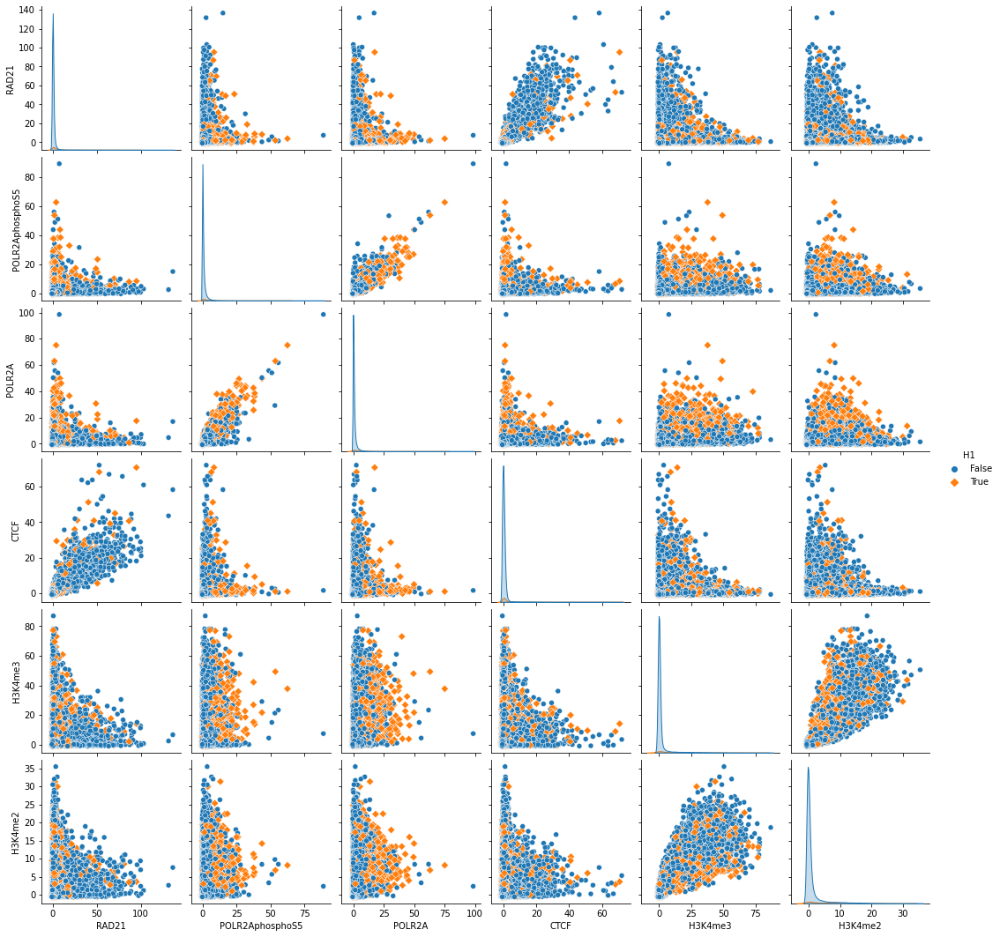

Most correlated features from Promoters epigenomes


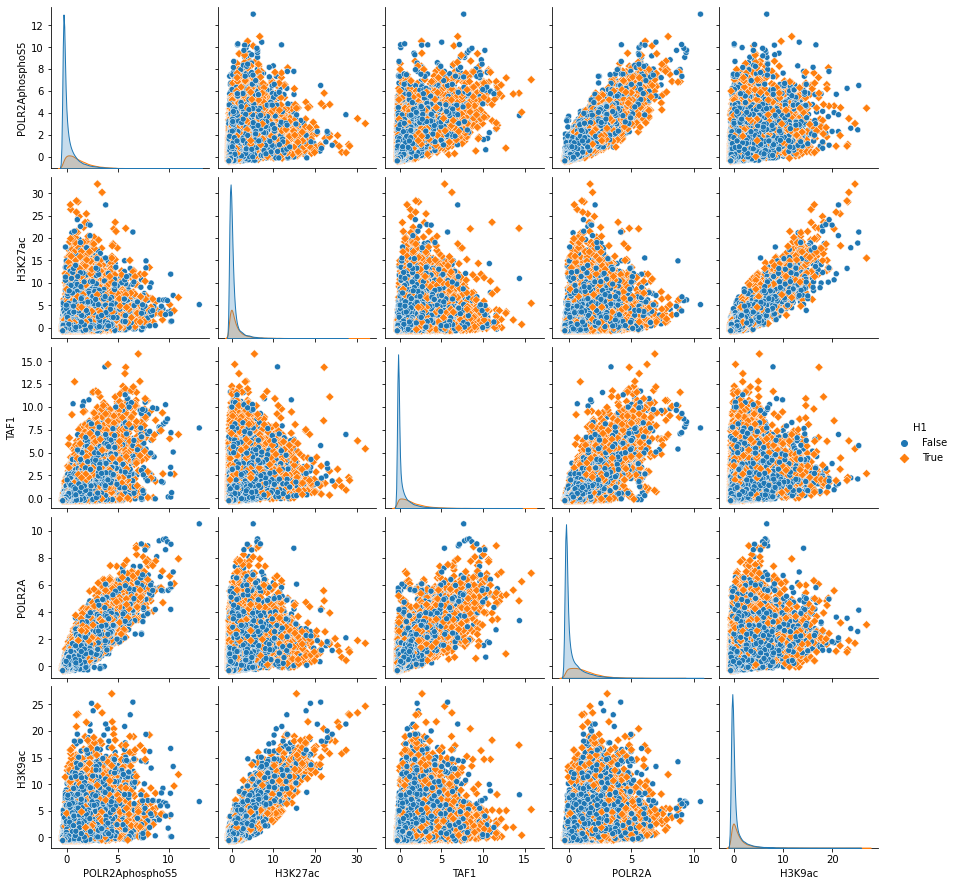

In [34]:
for region, x in epigenomes_data.items():
    _, firsts, seconds = list(zip(*scores[region][:3]))
    columns = list(set(firsts+seconds))
    print(f"Most correlated features from {region} epigenomes")
    sns.pairplot(pd.concat([
        x[columns],
        labels[region]
    ], axis=1), hue=labels[region].columns[0], markers=["o", "D"])
    plt.show()

#### Distribuzione delle Features
Per visualizzare le distribuzioni utilizzeremo gli istogrammi. Poiché non possiamo mostrare tutte le distribuzioni, selezioniamo le prime 10 Features più diverse. Definiamo la distanza tra le caratteristiche usando una distanza euclidea tra coppie di datapoint.

Per ridurre l'impatto dei valori anomali, filtriamo i valori anomali prima dello 0,01 percentile e dello 0,99 percentile.

In [35]:
from sklearn.metrics.pairwise import euclidean_distances

def get_top_most_different(dist, n:int):
    return np.argsort(-np.mean(dist, axis=1).flatten())[:n]

Top 5 different features from Enhancers.


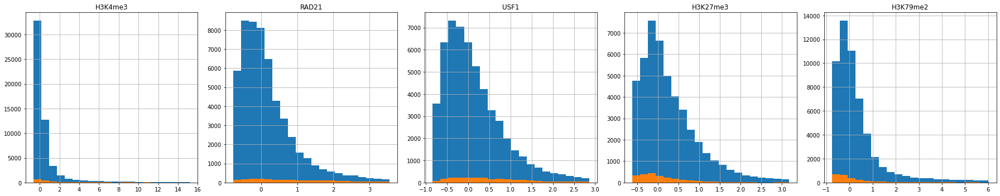

Top 5 different features from Promoters.


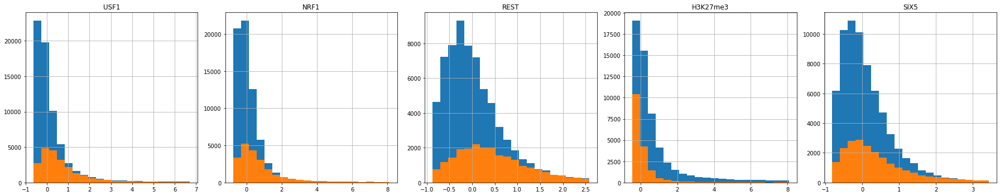

In [36]:
top_number = 5

for region, x in epigenomes_data.items():
    dist = euclidean_distances(x.T)
    most_distance_columns_indices = get_top_most_different(dist, top_number)
    columns = x.columns[most_distance_columns_indices]
    fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(25, 5))
    print(f"Top {top_number} different features from {region}.")
    for column, axis in zip(columns, axes.flatten()):
        head, tail = x[column].quantile([0.05, 0.95]).values.ravel()

        mask = ((x[column] < tail) & (x[column] > head)).values

        cleared_x = x[column][mask]
        cleared_y = labels[region].values.ravel()[mask]

        cleared_x[cleared_y==0].hist(ax=axis, bins=20)
        cleared_x[cleared_y==1].hist(ax=axis, bins=20)

        axis.set_title(column)
    fig.tight_layout()
    plt.show()

### Selezione delle features con Boruta e Random Forests

Nell'apprendimento automatico e nelle statistiche, la selezione delle features, è quell'operazione nota anche come processo di selezione di un sottoinsieme di caratteristiche rilevanti (variabili, predittori) da utilizzare nella costruzione di modelli. La premessa principale quando si utilizza una tecnica di selezione delle features è che i dati contengano alcune caratteristiche che sono ridondanti o irrilevanti e possono quindi essere rimosse senza incorrere in una grande perdita di informazioni.

L'algoritmo Boruta è costruito attorno all'algoritmo di classificazione random forest.

In [37]:
from sklearn.ensemble import RandomForestClassifier
from boruta import BorutaPy

def get_features_filter(X:pd.DataFrame, y:pd.DataFrame, name:str)->BorutaPy:
    boruta_selector = BorutaPy(
        RandomForestClassifier(n_jobs=cpu_count(), class_weight='balanced', max_depth=5),
        n_estimators='auto',
        verbose=2,
        alpha=0.05, # p_value
        max_iter=50, # In practice one would run at least 100-200 times
        random_state=42
    )
    boruta_selector.fit(X.values, y.values.ravel())
    return boruta_selector

filtered_epigenomes = {
    region:get_features_filter(
        X=x,
        y=labels[region],
        name=f"{cell_line}/{region}"
    ).transform(x.values)
    for region, x in tqdm(
        epigenomes_data.items(),
        desc="Running Baruta Feature estimation"
    )
}

Running Baruta Feature estimation:   0%|          | 0/2 [00:00<?, ?it/s]

Iteration: 	1 / 50
Confirmed: 	0
Tentative: 	56
Rejected: 	0
Iteration: 	2 / 50
Confirmed: 	0
Tentative: 	56
Rejected: 	0
Iteration: 	3 / 50
Confirmed: 	0
Tentative: 	56
Rejected: 	0
Iteration: 	4 / 50
Confirmed: 	0
Tentative: 	56
Rejected: 	0
Iteration: 	5 / 50
Confirmed: 	0
Tentative: 	56
Rejected: 	0
Iteration: 	6 / 50
Confirmed: 	0
Tentative: 	56
Rejected: 	0
Iteration: 	7 / 50
Confirmed: 	0
Tentative: 	56
Rejected: 	0
Iteration: 	8 / 50
Confirmed: 	48
Tentative: 	8
Rejected: 	0
Iteration: 	9 / 50
Confirmed: 	48
Tentative: 	8
Rejected: 	0
Iteration: 	10 / 50
Confirmed: 	48
Tentative: 	8
Rejected: 	0
Iteration: 	11 / 50
Confirmed: 	48
Tentative: 	8
Rejected: 	0
Iteration: 	12 / 50
Confirmed: 	49
Tentative: 	7
Rejected: 	0
Iteration: 	13 / 50
Confirmed: 	49
Tentative: 	7
Rejected: 	0
Iteration: 	14 / 50
Confirmed: 	49
Tentative: 	7
Rejected: 	0
Iteration: 	15 / 50
Confirmed: 	49
Tentative: 	6
Rejected: 	1
Iteration: 	16 / 50
Confirmed: 	49
Tentative: 	6
Rejected: 	1
Iteration: 	17 / 

### Data decomposition

In [38]:
tasks = {
    "x":[
        *[
            val.values
            for val in epigenomes_data.values()
        ],
        *[
            val.values
            for val in sequences.values()
        ]
    ],
    "y":[
        *[
            val.values.ravel()
            for val in labels.values()
        ],
        *[
            val.values.ravel()
            for val in labels.values()
        ]
    ],
    "titles":[
        "Epigenomes enhancers",
        "Epigenomes promoters",
        "Sequences enhancers",
        "Sequences promoters"
    ]
}

xs = tasks["x"]
ys = tasks["y"]
titles = tasks["titles"]
colors = np.array([
    "tab:blue",
    "tab:orange",
])

assert len(xs) == len(ys) == len(titles)

for x, y in zip(xs, ys):
    assert x.shape[0] == y.shape[0]

### PCA

In [39]:
from sklearn.decomposition import PCA

def pca(x:np.ndarray, n_components:int=2)->np.ndarray:
    return PCA(n_components=n_components, random_state=42).fit_transform(x)

Computing PCAs:   0%|          | 0/4 [00:00<?, ?it/s]

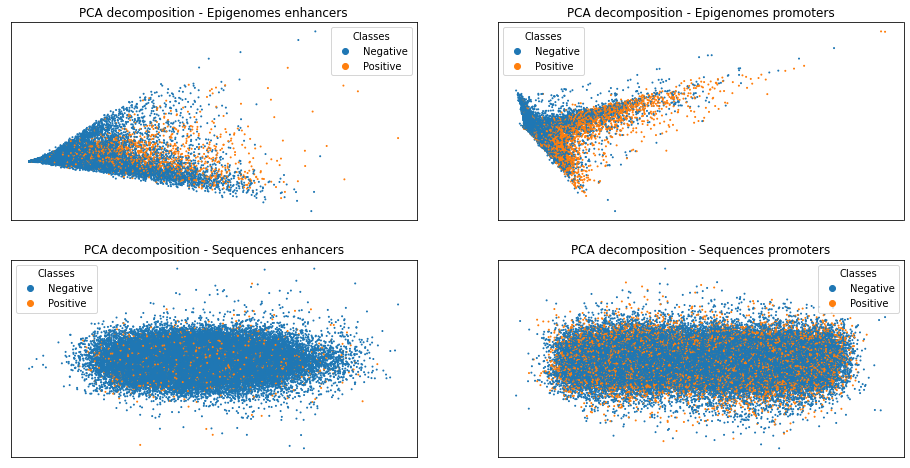

In [40]:
from matplotlib.colors import ListedColormap

directory = 'decomposition/PCA/'
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 8))

for x, y, title, axis in tqdm_notebook(
    zip(xs, ys, titles, axes.flatten()),
    desc="Computing PCAs",
    total=len(xs),
    leave=False
):
    scatter = axis.scatter(
        *pca(x).T,
        s=1,
        c=y,
        cmap=ListedColormap(["tab:blue", "tab:orange"])
    )
    axis.xaxis.set_visible(False)
    axis.yaxis.set_visible(False)
    axis.set_title(f"PCA decomposition - {title}")
    axis.legend(
        title="Classes",
        handles=scatter.legend_elements()[0],
        labels=["Negative", "Positive"]
    )
if not os.path.exists(directory):
    Path(directory).mkdir(parents=True, exist_ok=True)
fig.savefig(directory+"PCA_2.png")
plt.show()

T-SNE

Running perplexities:   0%|          | 0/6 [00:00<?, ?it/s]

Computing TSNEs:   0%|          | 0/4 [00:00<?, ?it/s]

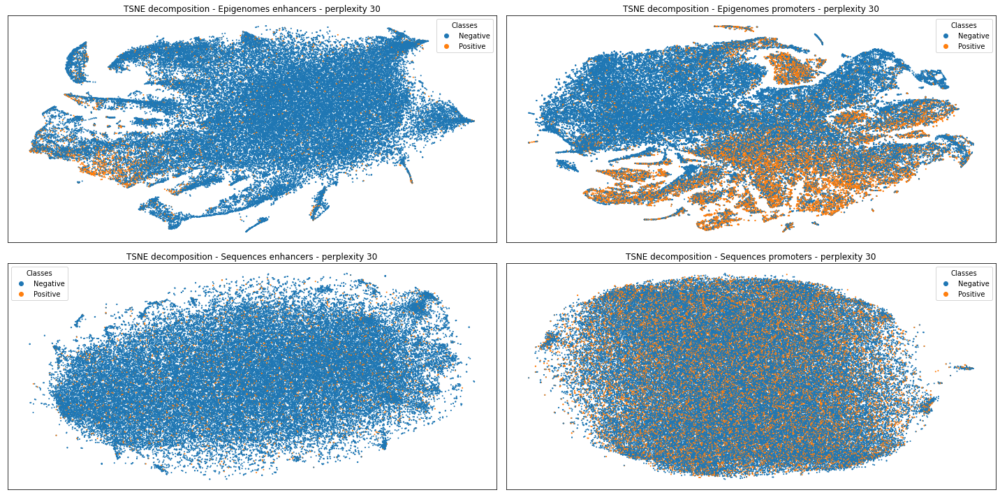

Computing TSNEs:   0%|          | 0/4 [00:00<?, ?it/s]

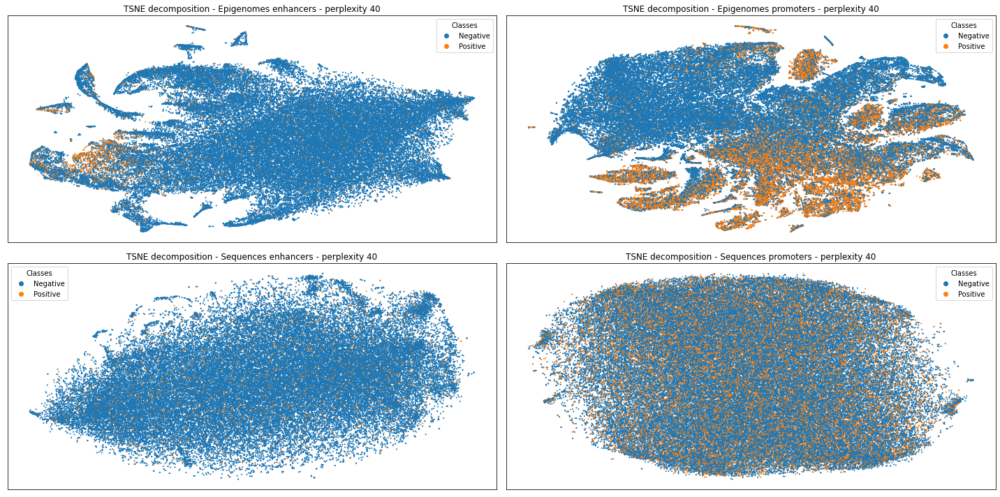

Computing TSNEs:   0%|          | 0/4 [00:00<?, ?it/s]

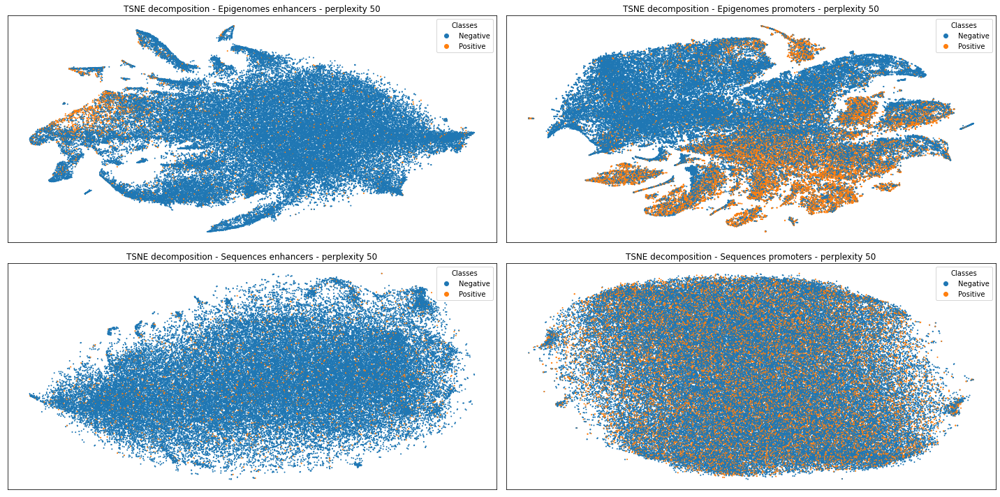

Computing TSNEs:   0%|          | 0/4 [00:00<?, ?it/s]

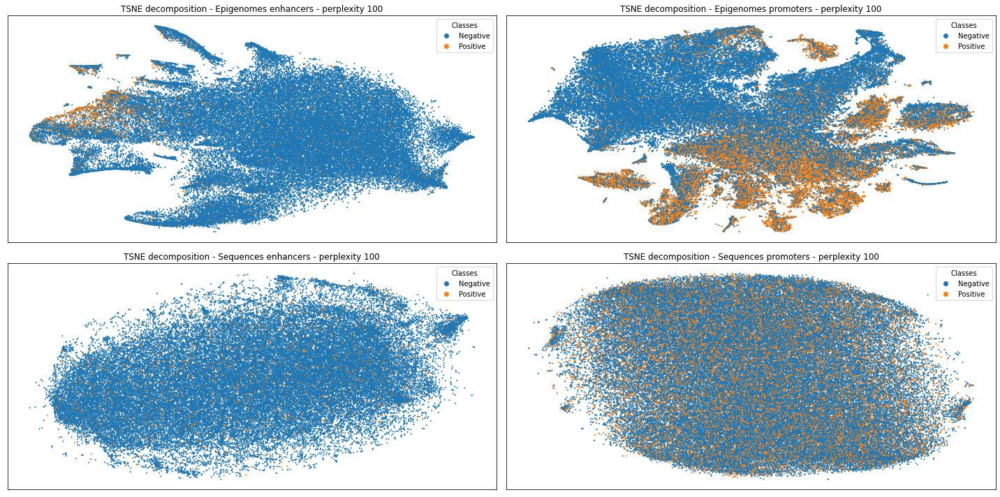

Computing TSNEs:   0%|          | 0/4 [00:00<?, ?it/s]

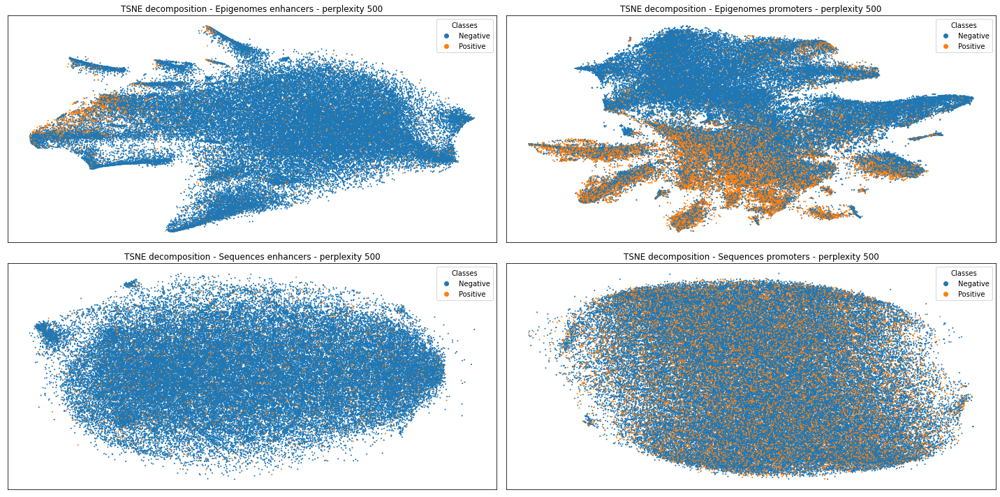

Computing TSNEs:   0%|          | 0/4 [00:00<?, ?it/s]

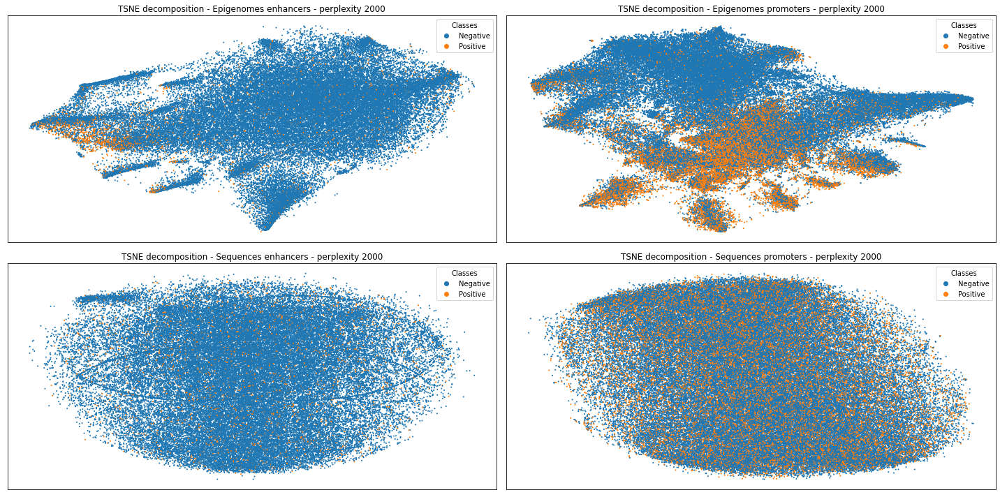

In [41]:
from MulticoreTSNE import MulticoreTSNE as UTSNE

directory = 'decomposition/TSNE/'
def ulyanov_tsne(
    x: np.ndarray,
    perplexity: int,
    dimensionality_threshold: int = 50,
    n_components: int = 2
):
    if x.shape[1] > dimensionality_threshold:
        x = pca(x, n_components=dimensionality_threshold)
    return UTSNE(
        n_components=n_components,
        perplexity=perplexity,
        n_jobs=cpu_count(),
        random_state=42,
        verbose=True
    ).fit_transform(x)

for perplexity in tqdm_notebook(
    (30, 40, 50, 100, 500, 2000),
    desc="Running perplexities",
    leave=False
):
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))
    for x, y, title, axis in tqdm_notebook(
        zip(xs, ys, titles, axes.flatten()),
        desc="Computing TSNEs",
        total=len(xs),
        leave=False
    ):
        scatter = axis.scatter(
            *ulyanov_tsne(x, perplexity=perplexity).T,
            s=1,
            c=y,
            cmap=ListedColormap(["tab:blue", "tab:orange"])
        )
        axis.xaxis.set_visible(False)
        axis.yaxis.set_visible(False)
        axis.set_title(f"TSNE decomposition - {title} - perplexity {perplexity}")
        axis.legend(
            title="Classes",
            handles=scatter.legend_elements()[0],
            labels=["Negative", "Positive"]
        )
    if not os.path.exists(directory):
        Path(directory).mkdir(parents=True, exist_ok=True)
    fig.savefig(f"{directory}+{perplexity}_TSNE.png")
    fig.tight_layout()
    plt.show()